# Práctica 2. Aprendizaje por refuerzo
## Inteligencia Artificial I    2021/2022

## Parte 1. Taxi
En este ejemplo (visto en clase) hay 4 ubicaciones (etiquetadas con letras diferentes) y nuestro trabajo es recoger al pasajero en una ubicación y dejarlo en otra. Se trata de llevar al pasajero que inicialmente está en (Y) a la posición destino (R). El taxi solo puede coger y dejar pasajeros en las posiciones marcadas.
Recibimos +20 puntos por dejar al pasajero con éxito y perderemos 1 punto por cada paso de tiempo. También hay una penalización de 10 puntos por acciones ilegales de recoger y dejar.

Vamos a utilizar OpenAI's Gym en Python donde tenemos definido este entorno y podemos desarrollar nuestro agente y evaluarlo. gym nos proporciona la representación y la visualización del tablero (render) por lo que no tenemos que hacerlo (aunque sería sencillo representarlo y resolverlo con cualquier algoritmo de búsqueda en AIMA). 

In [4]:
import sys
#!{sys.executable} -m pip install
# Para el ejemplo del taxi y el cart pool es necesario instalar algunas librerías (gym,cmake,scipy) si no están ya instaladas

# !pip install cmake

# Gym is a toolkit for developing and comparing reinforcement learning algorithms. It makes no assumptions about the structure of your agent, and is compatible with any numerical computation library, such as TensorFlow or Theano.
# La librería gym proporciona problemas de prueba — environments — con una interfaz general que puedes usar para probar 
# distintos algoritmos y configuraciones de RL. 

# !pip install gym
# tps://gym.openai.com/docs/

# !pip install scipy

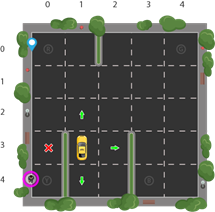

In [3]:
import gym
# el ejemplo del taxi es un entorno que ya está definido en gym por lo que no tenemos que representar este problema.
env = gym.make("Taxi-v3").env
env.render()

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+



La interfaz principal del entorno gym es env. 
Vamos a utilizar los siguientes métodos de env:

- env.reset: restablece el entorno y devuelve un estado inicial aleatorio.

- env.step (acción): realiza un paso en el entorno. Devuelve:

      observación: Observaciones del entorno
      recompensa: si su acción fue beneficiosa o no
      done: Indica si hemos recogido y dejado a un pasajero (fin de un episodio)
      info: información adicional como rendimiento y latencia para depuración
      
- env.render: renderiza el entorno (útil para visualizar el entorno)

In [6]:
env.reset() # resetea el estado del problema a un estado aleatorio. 

143

In [7]:
env.render() #visualiza el estado del problema

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+



- El cuadrado representa el taxi, que es amarillo sin pasajero y verde con pasajero.
- La marca ("|") representa una pared que el taxi no puede cruzar.
- R, G, Y, B son las posibles ubicaciones de recogida y destino. La letra azul representa la ubicación actual de recogida de pasajeros y la letra morada es el destino actual.


In [8]:
print("Action Space {}".format(env.action_space))
print("State Space {}".format(env.observation_space))

Action Space Discrete(6)
State Space Discrete(500)


El Action Space tiene tamaño 6 y el State Space tiene tamaño 500. El algoritmo RL no necesita más información que estas dos cosas. Todo lo que necesitamos es una forma de identificar un estado de forma única asignando un número único a cada estado posible, y RL aprende a elegir un número de acción de 0 a 5 donde:
   - 0 = sur
   - 1 = norte
   - 2 = este
   - 3 = oeste
   - 4 = recoger
   - 5 = dejar

Los 500 estados corresponden a una codificación de la ubicación del taxi, la ubicación del pasajero y la ubicación de destino.

El aprendizaje por refuerzo aprenderá un mapeo de estados con la acción óptima a realizar en ese estado. Para ello realizaremos un proceso de exploración, es decir, el agente explora el entorno y toma acciones basadas en las recompensas definidas en el entorno. La acción óptima para cada estado es la acción que tiene la mayor recompensa acumulativa a largo plazo según la fórmula vista para el Q-learning.

Dado el estado representado en la imagen anterior, vamos a codificar su estado y dárselo al entorno para que se renderice en Gym. 
Las filas y columnas se numeran de 0 a 4 y, como se ve en la imagen, tenemos el taxi en la fila 3, columna 1, nuestro pasajero está en la ubicación 2 y nuestro destino es la ubicación 0:  R (0), G (1), Y (2), B (3)

Usando el método de codificación de estado Taxi-v3, podemos hacer lo siguiente:

In [9]:
state = env.encode(3, 1, 2, 0) # (taxi row, taxi column, passenger index, destination index)
print("State:", state)
env.s = state
env.render()


State: 328
+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+



Podemos asertar las posiciones en el estado con env.encode() o usar los números entre 0 y 499 que son los 500 estados válidos en el espacio de estados. 

In [10]:
env.s = 499
env.render()

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B:_|
+---------+



In [11]:
env.s = 0
env.render()

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+



In [12]:
# Con el diccionario P del entorno (tiene más informacion que la matriz R que hemos visto en clase) podemos ver los valores de reward asignados por defecto al estado 328 que usamos como ejemplo
env.P[328]

{0: [(1.0, 428, -1, False)],
 1: [(1.0, 228, -1, False)],
 2: [(1.0, 348, -1, False)],
 3: [(1.0, 328, -1, False)],
 4: [(1.0, 328, -10, False)],
 5: [(1.0, 328, -10, False)]}

Este diccionario tiene la siguiente estructura {acción: [(probabilidad, próximo estado, recompensa, hecho)]}.

- El valor de 0-5 corresponde a las acciones (sur, norte, este, oeste, recogida, entrega) que el taxi puede realizar.
- La probabilidad es siempre 1.0 (en este entorno)
- nextstate muestra el estado siguiente usando la acción en este índice del diccionario.
- Las acciones de movimiento tienen por defecto una recompensa de -1 y pickup / dropoff tiene -10 Si estuvimos en un estado donde el taxi tiene un pasajero y estamos en la posición destino correcta se vería una recompensa de 20 en la action dropoff (5 ))
- done se utiliza para indicarnos cuándo hemos dejado a un pasajero en el lugar correcto. Cada dejada de un pasajero (dropoff) con éxito es el final de un episodio.

Hay que tener en cuenta que si nuestro agente eligiera explorar la acción dos (2) en este estado, iría hacia el este y chocaría contra una pared. El código fuente ha hecho imposible mover el taxi a través de una pared, por lo que si el taxi elige esa acción, seguirá acumulando -1 penalizaciones, lo que afecta la recompensa a largo plazo.

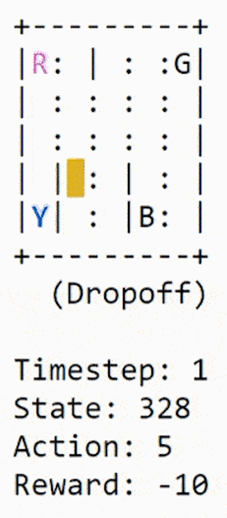

### Paso 1. Resolvemos el problema sin aprendizaje por refuerzo

Veamos qué pasaría si intentamos utilizar la fuerza bruta para resolver el problema sin RL.
Dado que tenemos nuestra tabla P para las recompensas predeterminadas en cada estado, podemos intentar que nuestro taxi navegue solo con eso.
Crearemos un bucle infinito que se ejecutará hasta que un pasajero llegue a un destino (un episodio), o en otras palabras, cuando la recompensa recibida sea 20.

El método env.action_space.sample () selecciona automáticamente una acción aleatoria del conjunto de todas las acciones posibles.


In [13]:
env.s = 328  # el estado de la imagen

epochs = 0
penalties, reward = 0, 0

frames = [] # for animation

done = False

while not done:
    action = env.action_space.sample()
    state, reward, done, info = env.step(action)

    if reward == -10:
        penalties += 1
    
    # Put each rendered frame into dict for animation
    frames.append({
        'frame': env.render(mode='ansi'),
        'state': state,
        'action': action,
        'reward': reward
        }
    )

    epochs += 1
    
    
print("Timesteps taken: {}".format(epochs))
print("Penalties incurred: {}".format(penalties))


Timesteps taken: 14643
Penalties incurred: 4691


In [14]:
from IPython.display import clear_output
from time import sleep

def print_frames(frames):
    for i, frame in enumerate(frames):
        clear_output(wait=True)
        #print(frame['frame'].getvalue())
        print(frame['frame'])
        print(f"Timestep: {i + 1}")
        print(f"State: {frame['state']}")
        print(f"Action: {frame['action']}")
        print(f"Reward: {frame['reward']}")
        sleep(.1)

In [15]:
print_frames(frames)

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (Dropoff)

Timestep: 14643
State: 0
Action: 5
Reward: 20


El agente va a ciegas y utiliza miles de pasos de tiempo y realiza muchos drop-offs incorrectos para entregar un solo pasajero al destino correcto (cuando acierte).  

Dejamos como ejercicio opcional la resolución de este problema con cualquiera de los algoritmos de búsqueda de AIMA definiendo la clase Problem usando la codificación numérica de los estados de este entorno y las 5 acciones que hemos visto haciendo una llamada a next_state, reward, done, info = env.step(action) 

Vamos a resolverlo aquí con Aprendizaje por refuerzo que empieza haciendo ciclos a ciegas y aprende de la experiencia pasada.  Cuando "por casualidad" acertamos el agente guarda en la memoria (en forma de recompensa) qué acción fue la mejor para cada estado. Así en el futuro elegirá esa acción. 

In [16]:
import gym
env = gym.make("Taxi-v3").env
# Estado inicial aleatorio
env.reset() # reset environment to a new, random state   EStado inicial aleatorio 
# O estado inicial establecido 
state = env.encode(3, 1, 2, 0) # (taxi row, taxi column, passenger index, destination index)
print("State:", state)
env.s = state
env.render()

State: 328
+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+



In [17]:
env.s = 499
env.render()
# cuadrado amarillo: taxi sin pasajero and green with a passenger.
# R, G, Y, B are the possible pickup and destination locations. 
#The blue letter represents the current passenger pick-up location, and the purple letter is the current destination.

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B:_|
+---------+



In [18]:
state = env.encode(3, 1, 2, 0)     # 3,1 son as coordenadas del taxi.  
# 2 y 0 son las posiciones del pasajero y dejada del pasajero que estan numeradas de 0..4
#  passenger index, destination index  (creo que para indicar que esta en el taxi se usa tambien .. mirar.)

action = env.action_space.sample()    # genera una acción aleatoria
# Recordamos las acciones: 0 = south; 1 = north; 2 = east; 3 = west; 4 = pickup; 5 = dropoff
env.render()
next_state, reward, done, info = env.step(action) 
print("State:", state)
print("Action:", action)


+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B:_|
+---------+

State: 328
Action: 5


In [19]:
#next_state = env.step(action)[0] 
print("Next State:", next_state)
env.s = next_state
env.render()

Next State: 499
+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B:_|
+---------+
  (Dropoff)


In [20]:
action = 5   
# Recordamos las acciones: 0 = south; 1 = north; 2 = east; 3 = west; 4 = pickup; 5 = dropoff
env.render()
next_state, reward, done, info = env.step(action) 
print("State:", state)
print("Next Action:", action)

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B:_|
+---------+
  (Dropoff)
State: 328
Next Action: 5


In [21]:
print("Next State:", next_state)
env.s = next_state
env.render()
# como hacemos dropoff de un taxi vacio no hace nada

Next State: 499
+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B:_|
+---------+
  (Dropoff)


In [22]:
env.s = 300
state = env.s
next_state = 0
action = 3   
env.render()
next_state, reward, done, info = env.step(action) 
print("State:", state)
print("Next Action:", action)
print("Next State:", next_state)

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (Dropoff)
State: 300
Next Action: 3
Next State: 300


In [23]:
env.s = next_state
env.render()

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (West)


### Aprendizaje por refuerzo

Vamos a utilizar el algoritmo de Q-learning que hemos visto en clase y que le dará a nuestro agente algo de memoria.
Básicamente, Q-learning permite al agente utilizar las recompensas del entorno para aprender, con el tiempo, la mejor acción a realizar en un estado determinado.
En nuestro entorno de Taxi, tenemos la tabla de recompensas, P, de la que el agente aprenderá. Lo hace buscando recibir una recompensa por realizar una acción en el estado actual y luego actualizar un valor Q para recordar si esa acción fue beneficiosa.
Los valores almacenados en la tabla Q se denominan valores Q y se asignan a una combinación (estado, acción).
Un valor Q para una combinación de acción de estado particular es representativo de la "calidad" de una acción tomada desde ese estado. Mejores valores Q implican mejores posibilidades de obtener mayores recompensas.
Por ejemplo, si el taxi se enfrenta a un estado que incluye a un pasajero en su ubicación actual, es muy probable que el valor Q para la recogida sea más alto en comparación con otras acciones, como la bajada o el norte.
Los valores Q se inicializan a un valor arbitrario y, a medida que el agente se expone al entorno y recibe diferentes recompensas al ejecutar diferentes acciones, los valores Q se actualizan mediante la ecuación:

Q (estado, acción) ← (1 − α) Q (estado, acción) + α (recompensa + γ maxa Q (siguiente estado, todas las acciones))

Dónde:
- α (alfa) es la tasa de aprendizaje (0 <α≤1) - Al igual que en los entornos de aprendizaje supervisado, αα es la medida en que nuestros valores Q se actualizan en cada iteración.
- γ (gamma) es el factor de descuento (0≤γ≤1) - determina cuánta importancia queremos dar a las recompensas futuras. Un valor alto para el factor de descuento (cercano a 1) captura la recompensa efectiva a largo plazo, mientras que un factor de descuento de 0 hace que nuestro agente considere solo la recompensa inmediata.

En la fórmula anterior estamos asignando (←), o actualizando, el valor Q del estado actual y la acción del agente tomando primero un peso (1 − α) del antiguo valor Q y luego agregando el valor aprendido. El valor aprendido es una combinación de la recompensa por realizar la acción actual en el estado actual y la recompensa máxima descontada del siguiente estado en el que estaremos una vez que realicemos la acción actual.
Básicamente, estamos aprendiendo la acción adecuada a tomar en el estado actual al observar la recompensa por la combinación estado / acción actual y las recompensas máximas para el siguiente estado. Esto eventualmente hará que nuestro taxi considere la ruta con las mejores recompensas.
El valor Q de un par estado-acción es la suma de la recompensa instantánea y la recompensa futura descontada (del estado resultante). La forma en que almacenamos los valores Q para cada estado y acción es a través de una tabla Q

La tabla Q es una matriz donde tenemos una fila para cada estado (500) y una columna para cada acción (6). Primero se inicializa a 0 y luego los valores se actualizan después del entrenamiento. Tenga en cuenta que la Q-table tiene las mismas dimensiones que la mesa de recompensas, pero tiene un propósito completamente diferente.

En la siguiente figura los valores de la Q-Table se inicializan a cero y se van actualizando durante el aprendizaje.  Los valores optimizan el recorrido del agente a traves del entorno buscando las máximas recompensas. 

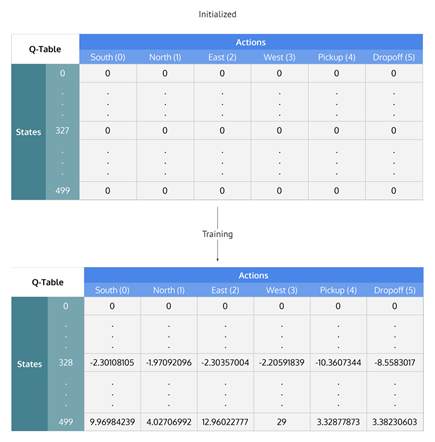

### Resumen del proceso de Q-Learning

    • Inicializar la tabla Q a todo ceros.
    • Comenzar a explorar acciones: para cada estado, seleccione cualquiera de las posibles acciones para el estado actual (S).
    • Ir al siguiente estado (S ') como resultado de esa acción (a).
    • Para todas las acciones posibles del estado (S '), seleccione la que tenga el valor Q más alto.
    • Actualizar los valores de la tabla Q utilizando la ecuación.
    • Establecer el siguiente estado como el estado actual.
    • Si se alcanza el estado objetivo, finalizar y repetir el proceso.

### Explotación de valores aprendidos

Después de una fase de exploración aleatoria de acciones, los valores Q tienden a converger sirviendo a nuestro agente como una función de valor de acción que puede explotar para elegir la acción mejor para un estado dado.
Existe una compensación entre exploración (elegir una acción aleatoria) y explotación (elegir acciones basadas en valores Q ya aprendidos). Queremos evitar que la acción siga siempre la misma ruta y posiblemente se sobreajuste, por lo que introduciremos otro parámetro llamado ϵ "épsilon" para atender esto durante el entrenamiento.
En lugar de simplemente seleccionar la acción de valor Q mejor aprendida, a veces preferimos explorar más el espacio de acción. Un valor de épsilon más bajo da como resultado episodios con más penalizaciones (en promedio), lo cual es obvio porque estamos explorando y tomando decisiones al azar.

In [24]:
# Primero se inicializa la Q-table a 500×6500×6 matrix of zeros:

import numpy as np
q_table = np.zeros([env.observation_space.n, env.action_space.n])


Ejecutar el aprendizaje es un proceso lento pero se realiza una única vez. 
Una vez entrenado, podemos resolver cualquier problema de este entorno simplemente consultando la tabla y eligiendo la acción que maximiza la recompensa en cada paso (explotación). 
El algoritmo de entrenamiento que actualizará esta Q-table a medida que el agente explora el entorno durante miles de episodios. 

En la primera parte del bucle (while not done) decidimos si elegir una acción aleatoria o explotar los valores Q ya calculados. Esto se hace simplemente usando el valor épsilon y comparándolo con la función random.uniform (0, 1), que devuelve un número arbitrario entre 0 y 1.
Ejecutamos la acción elegida en el entorno para obtener el next_state y la recompensa por realizar la acción. Después de eso, calculamos el valor Q máximo para las acciones correspondientes al next_state, y con eso, podemos actualizar fácilmente nuestro valor Q al new_q_value:

In [25]:
%%time
"""Training the agent"""

import random
from IPython.display import clear_output

# Hyperparameters
alpha = 0.1
gamma = 0.6
epsilon = 0.1

# For plotting metrics
all_epochs = []
all_penalties = []

for i in range(1, 100001):
    state = env.reset()

    epochs, penalties, reward, = 0, 0, 0
    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        next_state, reward, done, info = env.step(action) 
        
        old_value = q_table[state, action]
        next_max = np.max(q_table[next_state])
        
        new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)
        q_table[state, action] = new_value

        if reward == -10:
            penalties += 1

        state = next_state
        epochs += 1
        
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")

print("Training finished.\n")


Episode: 100000
Training finished.

Wall time: 1min 34s


In [26]:
# La tabla Q ha cambiado despues de 100000 episodios. Vamos a ver cuales son los Q-values aprendidos en el estado de ejemplo. 
q_table[328]

array([ -2.41501366,  -2.27325184,  -2.41058084,  -2.36015686,
       -10.96255063, -10.75105586])

El valor máximo de Q es "norte" (-1,971), por lo que parece que Q-learning ha aprendido efectivamente la mejor acción a realizar en el estado de la imagen.

### Evaluar el comportamiento del agente despues del proceso de Q-learning 

Para evaluar el comportamiento de nuestro agente no necesitamos explorar más acciones. En el comportamiento del agente ahora la siguiente acción siempre se selecciona utilizando el mejor valor Q:

In [27]:
total_epochs, total_penalties = 0, 0
episodes = 100

for _ in range(episodes):
    state = env.reset()
    epochs, penalties, reward = 0, 0, 0
    
    done = False
    
    while not done:
        action = np.argmax(q_table[state])
        state, reward, done, info = env.step(action)

        if reward == -10:
            penalties += 1

        epochs += 1

    total_penalties += penalties
    total_epochs += epochs

print(f"Results after {episodes} episodes:")
print(f"Average timesteps per episode: {total_epochs / episodes}")
print(f"Average penalties per episode: {total_penalties / episodes}")

Results after 100 episodes:
Average timesteps per episode: 12.97
Average penalties per episode: 0.0


Podemos ver en la evaluación que el comportamiento del agente ha mejorado significativamente y no hay penalizaciones, lo que significa que realizó las acciones correctas de recogida / devolución con 100 pasajeros diferentes.

Comparando los dos agentes vemos como aunque con Q-learning el agente comete errores inicialmente durante la exploración, una vez que ha explorado lo suficiente (visto la mayoría de los estados), puede actuar sabiamente maximizando las recompensas haciendo movimientos inteligentes. 

Veamos cuánto mejor es nuestra solución de Q-learning en comparación con el agente que realiza movimientos aleatorios.

Evaluamos a nuestros agentes de acuerdo con las siguientes métricas,

    • Número medio de penalizaciones por episodio: Cuanto menor sea el número, mejor será el desempeño de nuestro agente. Idealmente, nos gustaría que esta métrica fuera cero o muy cercana a cero.

    • Número promedio de pasos de tiempo por viaje: también queremos un número pequeño de pasos de tiempo por episodio, ya que queremos que nuestro agente dé pasos mínimos (es decir, el camino más corto) para llegar al destino.

    • Promedio de recompensas por movimiento: cuanto mayor sea la recompensa, significa que el agente está haciendo lo correcto. Es por eso que decidir las recompensas es una parte crucial del aprendizaje por refuerzo. En nuestro caso, dado que tanto los tiempos como las penalizaciones se recompensan negativamente, una recompensa promedio más alta significaría que el agente llega al destino lo más rápido posible con la menor cantidad de penalizaciones.


    Average rewards per move	-3.9012092102214075	0.6962843295638126
    Average number of penalties per episode	920.45	0.0
    Average number of timesteps per trip	2848.14	12.38

Estas métricas se calcularon en más de 100 episodios. 
Y como muestran los resultados, nuestro agente de Q-learning tiene un buen comportamiento. 


### Hiperparámetros y optimizaciones

Los valores de `alpha`,` gamma` y `epsilon` que hemos utilizado han sido elegidos por intuición, prueba y error pero hay mejores formas de obtener buenos valores. Idealmente, los tres deberían disminuir con el tiempo porque a medida que el agente continúa aprendiendo, en realidad construye antecedentes más válidos y duraderos;

    • α: (la tasa de aprendizaje) debería disminuir a medida que continúa adquiriendo una base de conocimientos cada vez mayor.
    • γ: a medida que se acerca cada vez más al valor límite, su preferencia por la recompensa a corto plazo debería aumentar, ya que no estará el tiempo suficiente para obtener la recompensa a largo plazo, lo que significa que su gamma debería disminuir.
    • ϵ: a medida que desarrollamos nuestra estrategia, tenemos menos necesidad de exploración y más explotación para obtener más utilidad de nuestra política, por lo que a medida que aumentan los ensayos, épsilon debería disminuir.

Una forma de obtener la combinación correcta de valores de hiperparámetros sería usar optimización local con algoritmos genéticos. 

Q-learning es uno de los algoritmos de aprendizaje por refuerzo más fáciles. Sin embargo, el problema con la obtención de Q es que, una vez que el número de estados en el entorno es muy alto, se vuelve difícil implementarlos con la tabla Q, ya que el tamaño sería muy, muy grande. Por eso se utilizan redes neuronales profundas en lugar de Q-table (Deep Reinforcement Learning). La red neuronal recibe información de estado y acciones en la capa de entrada y aprende a generar la acción correcta a lo largo del tiempo. Las técnicas de aprendizaje profundo (como las redes neuronales convolucionales) también se utilizan para interpretar los píxeles en la pantalla y extraer información del juego (como puntuaciones), y luego dejar que el agente controle el juego.

### Ejercicios   

#### Ejercicio 1. 
Hemos realizado aprendizaje. Utiliza los valores Q aprendidos para solucionar otro problema, es decir, cambiando el estado inicial/objetivo  




In [28]:
total_penalties = 0
state = env.reset()
penalties, reward = 0, 0
    
done = False
frames = []
    
while not done:
    action = np.argmax(q_table[state])
    state, reward, done, info = env.step(action)

    if reward == -10:
        penalties += 1
    
    frames.append({
        'frame': env.render(mode='ansi'),
        'state': state,
        'action': action,
        'reward': reward
        }
    )

total_penalties += penalties
total_epochs += epochs

print_frames(frames)
print(f"Penalties: {total_penalties}")

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (Dropoff)

Timestep: 13
State: 410
Action: 5
Reward: 20
Penalties: 0


#### Ejercicio 2.

En el problema del Taxi resuelto con Q-Learning se pide experimentar con distintos estados iniciales y distintos valores de los hiperparámetros y con distinto números de episodios de aprendizaje y comentar los resultados obtenidos. Observa el comportamiento del agente con los valores límite de los hiperparámetros.

Comenta de forma razonada las conclusiones obtenidas de los distintos procesos de aprendizaje. 
Evalua y compara los agentes respecto a las métricas dadas 


PRUEBAS CON DISTINTO NÚMERO DE EPISODIOS DE APRENDIZAJE

Ejemplo 1: 1000 episodios de aprendizaje

In [14]:
%%time

"""Training the agent"""

import random
from IPython.display import clear_output

import numpy as np
q_table = np.zeros([env.observation_space.n, env.action_space.n])

# Hyperparameters
alpha = 0.1
gamma = 0.6
epsilon = 0.1

# For plotting metrics
all_epochs = []
all_penalties = []

for i in range(1, 1001):
    state = env.reset()

    epochs, penalties, reward, = 0, 0, 0
    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        next_state, reward, done, info = env.step(action) 
        
        old_value = q_table[state, action]
        next_max = np.max(q_table[next_state])
        
        new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)
        q_table[state, action] = new_value

        if reward == -10:
            penalties += 1

        state = next_state
        epochs += 1
        
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")

print("Training finished.\n")

Episode: 1000
Training finished.

Wall time: 1.82 s


In [15]:
total_epochs, total_penalties = 0, 0
episodes = 100

for _ in range(episodes):
    state = env.reset()
    epochs, penalties, reward = 0, 0, 0
    
    done = False
    
    while not done:
        action = np.argmax(q_table[state])
        state, reward, done, info = env.step(action)
        
        print(state)     # Mostramos los estados (para ver que se queda infinitamente en un mismo estado)
        
        if reward == -10:
            penalties += 1

        epochs += 1

    total_penalties += penalties
    total_epochs += epochs

print(f"Results after {episodes} episodes:")
print(f"Average timesteps per episode: {total_epochs / episodes}")
print(f"Average penalties per episode: {total_penalties / episodes}")

441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441
441


KeyboardInterrupt: 

Ejemplo 2: 10000 episodios de aprendizaje y Epsilon = 0.3

In [7]:
%%time

"""Training the agent"""

import random
from IPython.display import clear_output

import numpy as np
q_table = np.zeros([env.observation_space.n, env.action_space.n])

# Hyperparameters
alpha = 0.1
gamma = 0.6
epsilon = 0.1

# For plotting metrics
all_epochs = []
all_penalties = []

for i in range(1, 10001):
    state = env.reset()

    epochs, penalties, reward, = 0, 0, 0
    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        next_state, reward, done, info = env.step(action) 
        
        old_value = q_table[state, action]
        next_max = np.max(q_table[next_state])
        
        new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)
        q_table[state, action] = new_value

        if reward == -10:
            penalties += 1

        state = next_state
        epochs += 1
        
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")

print("Training finished.\n")

Episode: 10000
Training finished.

Wall time: 4.33 s


In [8]:
total_epochs, total_penalties = 0, 0
episodes = 100

epsilon = 0.3

for _ in range(episodes):
    state = env.reset()
    epochs, penalties, reward = 0, 0, 0
    
    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        state, reward, done, info = env.step(action)

        if reward == -10:
            penalties += 1

        epochs += 1

    total_penalties += penalties
    total_epochs += epochs

print(f"Results after {episodes} episodes:")
print(f"Average timesteps per episode: {total_epochs / episodes}")
print(f"Average penalties per episode: {total_penalties / episodes}")

Results after 100 episodes:
Average timesteps per episode: 20.24
Average penalties per episode: 2.03


Ejemplo 3: 50000 episodios de aprendizaje y Epsilon = 0.3

In [9]:
%%time

"""Training the agent"""

import random
from IPython.display import clear_output

import numpy as np
q_table = np.zeros([env.observation_space.n, env.action_space.n])

# Hyperparameters
alpha = 0.1
gamma = 0.6
epsilon = 0.1

# For plotting metrics
all_epochs = []
all_penalties = []

for i in range(1, 50001):
    state = env.reset()

    epochs, penalties, reward, = 0, 0, 0
    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        next_state, reward, done, info = env.step(action) 
        
        old_value = q_table[state, action]
        next_max = np.max(q_table[next_state])
        
        new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)
        q_table[state, action] = new_value

        if reward == -10:
            penalties += 1

        state = next_state
        epochs += 1
        
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")

print("Training finished.\n")

Episode: 50000
Training finished.

Wall time: 14.3 s


In [10]:
total_epochs, total_penalties = 0, 0
episodes = 100

epsilon = 0.3

for _ in range(episodes):
    state = env.reset()
    epochs, penalties, reward = 0, 0, 0
    
    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        state, reward, done, info = env.step(action)

        if reward == -10:
            penalties += 1

        epochs += 1

    total_penalties += penalties
    total_epochs += epochs

print(f"Results after {episodes} episodes:")
print(f"Average timesteps per episode: {total_epochs / episodes}")
print(f"Average penalties per episode: {total_penalties / episodes}")

Results after 100 episodes:
Average timesteps per episode: 18.59
Average penalties per episode: 1.41


Observaciones y Conclusiones:

Al realizar pruebas con distinto número de episodios de aprendizaje, podemos observar diferentes resultados. 

En primer lugar, en el ejemplo 1 hemos reducido el número de episodios de aprendizaje a tan solo 1000, lo cual hace que en las pruebas posteriores al aprendizaje se quede infinitamente en un mismo estado del juego del taxi, ya que al examinar la fila correspondiente del estado en cuestión, siempre escoge el valor mejor, lo cual puede ocasionar que siempre permanezca en el mismo estado realizando la mencionada acción.

Para solucionar esto, en el ejemplo 2 hemos introducido un valor de epsilon = 0.3 algo más alto, para que haya posibilidad de seguir explorando y no se quede estancado en un mismo estado simepre. De esta forma, al realizar las pruebas tras un aprendizaje de 10000 episodios, observamos cómo obtiene soluciones para los episodios de prueba, aunque con un número medio de penalizaciones por episodio de 2.03 y 20.24 pasos de media por episodio (datos peores que con el entrenamiento de 100000 episodios).

Por último, hemos probado a aumentar el número de episodios en el ejemplo 3 hasta los 50000 episodios. Como era de esperar, obtenemos mejores resultados que en el ejemplo 2, ahora con menos pasos de media por episodio: 18.59 y menos penalizaciones de media por episodios: 1.41. 

PRUEBAS CON DISTINTO ALPHA

Ejemplo 4: Alpha = 0 (Caso límite 1)

In [16]:
%%time

"""Training the agent"""

import random
from IPython.display import clear_output

import numpy as np
q_table = np.zeros([env.observation_space.n, env.action_space.n])

# Hyperparameters
alpha = 0                 # Alpha = 0
gamma = 0.6
epsilon = 0.1

# For plotting metrics
all_epochs = []
all_penalties = []

for i in range(1, 100001):
    state = env.reset()

    epochs, penalties, reward, = 0, 0, 0
    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        next_state, reward, done, info = env.step(action) 
        
        old_value = q_table[state, action]
        next_max = np.max(q_table[next_state])
        
        new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)         # new_value = old_value
        q_table[state, action] = new_value
        
        print(q_table)

        if reward == -10:
            penalties += 1

        state = next_state
        epochs += 1
        
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")

print("Training finished.\n")

[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0

KeyboardInterrupt: 

Ejemplo 5: Alpha = 1 (Caso límite 2)

In [19]:
%%time

"""Training the agent"""

import random
from IPython.display import clear_output

import numpy as np
q_table = np.zeros([env.observation_space.n, env.action_space.n])

# Hyperparameters
alpha = 1                  # Alpha = 1
gamma = 0.6
epsilon = 0.1

# For plotting metrics
all_epochs = []
all_penalties = []

for i in range(1, 100001):
    state = env.reset()

    epochs, penalties, reward, = 0, 0, 0
    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        next_state, reward, done, info = env.step(action) 
        
        old_value = q_table[state, action]
        next_max = np.max(q_table[next_state])
        
        new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)      # new_value = reward + gamma * next_max
        q_table[state, action] = new_value

        if reward == -10:
            penalties += 1

        state = next_state
        epochs += 1
        
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")

print("Training finished.\n")

Episode: 100000
Training finished.

Wall time: 25.5 s


In [20]:
q_table

array([[  0.        ,   0.        ,   0.        ,   0.        ,
          0.        ,   0.        ],
       [ -2.41837066,  -2.3639511 ,  -2.41837066,  -2.3639511 ,
         -2.27325184, -11.3639511 ],
       [ -1.870144  ,  -1.45024   ,  -1.870144  ,  -1.45024   ,
         -0.7504    , -10.45024   ],
       ...,
       [ -0.7504    ,   0.416     ,  -0.7504    ,  -1.45024   ,
         -9.7504    ,  -9.7504    ],
       [ -2.430016  ,  -2.1220864 ,  -2.27325184,  -2.1220864 ,
        -11.27325184, -11.27325184],
       [  5.6       ,   2.36      ,   5.6       ,  11.        ,
         -3.4       ,  -3.4       ]])

Ejemplo 6: Alpha = 0.9 con 100000 episodios

In [21]:
%%time

"""Training the agent"""

import random
from IPython.display import clear_output

import numpy as np
q_table = np.zeros([env.observation_space.n, env.action_space.n])

# Hyperparameters
alpha = 0.9
gamma = 0.6
epsilon = 0.1

# For plotting metrics
all_epochs = []
all_penalties = []

for i in range(1, 100001):
    state = env.reset()

    epochs, penalties, reward, = 0, 0, 0
    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        next_state, reward, done, info = env.step(action) 
        
        old_value = q_table[state, action]
        next_max = np.max(q_table[next_state])
        
        new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)
        q_table[state, action] = new_value

        if reward == -10:
            penalties += 1

        state = next_state
        epochs += 1
        
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")

print("Training finished.\n")

Episode: 100000
Training finished.

Wall time: 25 s


In [22]:
total_epochs, total_penalties = 0, 0
episodes = 100

for _ in range(episodes):
    state = env.reset()
    epochs, penalties, reward = 0, 0, 0
    
    done = False
    
    while not done:

        action = np.argmax(q_table[state]) # Exploit learned values

        state, reward, done, info = env.step(action)

        if reward == -10:
            penalties += 1

        epochs += 1

    total_penalties += penalties
    total_epochs += epochs

print(f"Results after {episodes} episodes:")
print(f"Average timesteps per episode: {total_epochs / episodes}")
print(f"Average penalties per episode: {total_penalties / episodes}")

Results after 100 episodes:
Average timesteps per episode: 13.15
Average penalties per episode: 0.0


Ejemplo 7: Alpha = 0.9 con 10000 episodios y Epsilon = 0.3

In [25]:
%%time

"""Training the agent"""

import random
from IPython.display import clear_output

import numpy as np
q_table = np.zeros([env.observation_space.n, env.action_space.n])

# Hyperparameters
alpha = 0.9
gamma = 0.6
epsilon = 0.1

# For plotting metrics
all_epochs = []
all_penalties = []

for i in range(1, 10001):
    state = env.reset()

    epochs, penalties, reward, = 0, 0, 0
    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        next_state, reward, done, info = env.step(action) 
        
        old_value = q_table[state, action]
        next_max = np.max(q_table[next_state])
        
        new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)
        q_table[state, action] = new_value

        if reward == -10:
            penalties += 1

        state = next_state
        epochs += 1
        
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")

print("Training finished.\n")

Episode: 10000
Training finished.

Wall time: 2.74 s


In [35]:
total_epochs, total_penalties = 0, 0
episodes = 100

epsilon = 0.3

for _ in range(episodes):
    state = env.reset()
    epochs, penalties, reward = 0, 0, 0
    
    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        state, reward, done, info = env.step(action)

        if reward == -10:
            penalties += 1

        epochs += 1

    total_penalties += penalties
    total_epochs += epochs

print(f"Results after {episodes} episodes:")
print(f"Average timesteps per episode: {total_epochs / episodes}")
print(f"Average penalties per episode: {total_penalties / episodes}")

Results after 100 episodes:
Average timesteps per episode: 20.74
Average penalties per episode: 1.89


Observaciones y Conclusiones:

Como hemos visto en clase, Alpha es la "velocidad de aprendizaje" a la que va a progresar el Q-learning. Cuando tenemos valores de Alpha cercanos a 0 aprendemos poco o nada de cada nueva experiencia y cuando tenemos valores de Alpha cercanos a 1 aprendemos todo en base a la nueva experiencia, dejando de lado lo anteriormente aprendido. Esto se puede ver claramente en la línea: new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max), que resume la importancia del parámetro Alpha.

En el ejemplo 4 ponemos Alpha = 0 y como es lógico q_table se mantiene siempre a todo ceros puesto que no avanza nada el aprendizaje en cada paso, por lo que este caso no tiene interés.

new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max) = old_value  (alpha = 0)

En el ejemplo 5 ponemos Alpha = 1 y, aunque q_table se actualiza en cada paso, lo hace con información de la última experiencia, olvidando siempre casi todo lo aprendido anteriormente. Luego, este caso vuelve a no tener interés.

new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max) = reward + gamma * next_max  (alpha = 1)

En los ejemplos 5 y 6 probamos a poner Alpha = 0.9 (cercano a 1, fiándonos principalmente de la nueva experiencia) primero con 100000 episodios de aprendizaje y luego con 10000 epsiodios de aprendizaje y Epsilon = 0.3. Como se puede comprobar en los resultados, esto hace que empeoren ligeramente respecto a cuando utilizamos Alpha = 0.1 en cuanto al número de pasos de media por episodio, aunque no es una variación significativa. Como ya comentamos en clase, lo ideal sería ir reduciendo el valor de Alpha a medida que se realiza el aprendizaje, para al principio aprender mucho de las primeras experiencias, y después complementar el aprendizaje cada vez más con lo que llevamos aprendido.

PRUEBAS CON DISTINTO GAMMA

Ejemplo 8: Gamma = 0 (Caso límite 3)

In [46]:
%%time

"""Training the agent"""

import random
from IPython.display import clear_output

import numpy as np
q_table = np.zeros([env.observation_space.n, env.action_space.n])

# Hyperparameters
alpha = 0.1
gamma = 0             # Gamma = 0
epsilon = 0.9

# For plotting metrics
all_epochs = []
all_penalties = []

for i in range(1, 1001):
    state = env.reset()

    epochs, penalties, reward, = 0, 0, 0
    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        next_state, reward, done, info = env.step(action) 
        
        old_value = q_table[state, action]
        next_max = np.max(q_table[next_state])
        
        new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)       # reward + gamma * next_max = reward
        q_table[state, action] = new_value

        if reward == -10:
            penalties += 1

        state = next_state
        epochs += 1
        
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")

print("Training finished.\n")

Episode: 1000
Training finished.

Wall time: 44.8 s


In [47]:
q_table

array([[  0.        ,   0.        ,   0.        ,   0.        ,
          0.        ,   0.        ],
       [ -1.        ,  -1.        ,  -1.        ,  -1.        ,
         -1.        , -10.        ],
       [ -1.        ,  -1.        ,  -1.        ,  -1.        ,
         -1.        , -10.        ],
       ...,
       [ -1.        ,  -1.        ,  -1.        ,  -1.        ,
        -10.        , -10.        ],
       [ -1.        ,  -1.        ,  -1.        ,  -1.        ,
        -10.        , -10.        ],
       [ -1.        ,  -1.        ,  -1.        ,  -1.        ,
         -9.99999998, -10.        ]])

Ejemplo 9: Gamma = 1 (Caso límite 4)

In [82]:
%%time

"""Training the agent"""

import random
from IPython.display import clear_output

import numpy as np
q_table = np.zeros([env.observation_space.n, env.action_space.n])

# Hyperparameters
alpha = 0.1
gamma = 1            # Gamma = 1
epsilon = 0.1

# For plotting metrics
all_epochs = []
all_penalties = []

for i in range(1, 10001):
    state = env.reset()

    epochs, penalties, reward, = 0, 0, 0
    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        next_state, reward, done, info = env.step(action) 
        
        old_value = q_table[state, action]
        next_max = np.max(q_table[next_state])
        
        new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)          # reward + 1 * next_max
        q_table[state, action] = new_value

        if reward == -10:
            penalties += 1

        state = next_state
        epochs += 1
        
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")

print("Training finished.\n")

Episode: 10000
Training finished.

Wall time: 3.62 s


In [57]:
total_epochs, total_penalties = 0, 0
episodes = 100

for _ in range(episodes):
    state = env.reset()
    epochs, penalties, reward = 0, 0, 0
    
    done = False
    
    while not done:

        action = np.argmax(q_table[state]) # Exploit learned values

        state, reward, done, info = env.step(action)

        if reward == -10:
            penalties += 1

        epochs += 1

    total_penalties += penalties
    total_epochs += epochs

print(f"Results after {episodes} episodes:")
print(f"Average timesteps per episode: {total_epochs / episodes}")
print(f"Average penalties per episode: {total_penalties / episodes}")

Results after 100 episodes:
Average timesteps per episode: 13.34
Average penalties per episode: 0.0


Ejemplo 10: Gamma = 0.1 con 100000 episodios

In [64]:
%%time

"""Training the agent"""

import random
from IPython.display import clear_output

import numpy as np
q_table = np.zeros([env.observation_space.n, env.action_space.n])

# Hyperparameters
alpha = 0.1
gamma = 0.1
epsilon = 0.1

# For plotting metrics
all_epochs = []
all_penalties = []

for i in range(1, 100001):
    state = env.reset()

    epochs, penalties, reward, = 0, 0, 0
    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        next_state, reward, done, info = env.step(action) 
        
        old_value = q_table[state, action]
        next_max = np.max(q_table[next_state])
        
        new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)
        q_table[state, action] = new_value

        if reward == -10:
            penalties += 1

        state = next_state
        epochs += 1
        
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")

print("Training finished.\n")

Episode: 100000
Training finished.

Wall time: 31 s


In [74]:
q_table

array([[  0.        ,   0.        ,   0.        ,   0.        ,
          0.        ,   0.        ],
       [ -1.11111111,  -1.11111111,  -1.11111111,  -1.11111111,
         -1.11111109, -10.1111101 ],
       [ -1.111109  ,  -1.11109   ,  -1.111109  ,  -1.11109   ,
         -1.1109    , -10.11108846],
       ...,
       [ -1.11012629,  -1.109     ,  -1.10959408,  -1.11024547,
         -7.53142609,  -6.93031241],
       [ -1.11111092,  -1.1111109 ,  -1.11111092,  -1.1111109 ,
         -6.57783578,  -8.02645719],
       [ -0.89999996,  -1.08999964,  -0.89999993,   1.        ,
         -9.89999982,  -9.89999928]])

Ejemplo 11: Gamma = 0.05 con 10000 episodios y Epsilon = 0.3

Observaciones y Conclusiones:

Como hemos visto en clase, Gamma es la "tasa de descuento" por la cual se decide cuánto de grande es el impacto que tienen los refuerzos inmediatos y los refuerzos a largo plazo sobre el aprendizaje. Cuando Gamma es cercano a 0 tienen mucha importancia los refuerzos inmediatos (reward) y cuando es cercano a 1 tienen más importancia los refuerzos a largo plazo (next_max). Esto se ve muy claramente en la línea:  new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max), que resume la importancia del parámetro gamma.

En el ejemplo 8 ponemos Gamma = 0 y observamos que, como era de esperar, en q_table obtenemos solo valores de penalizaciones o refuerzos inmediatos (-1, -10). A la hora de realizar el aprendizaje, el algoritmo procede de forma muy lenta (para cualquiera valor epsilon que pongamos) lo cual es indicativo, junto a la q_table obtenida, de que este caso de Gamma = 0 es poco útil.

new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max) = (1 - alpha) * old_value + alpha * reward (gamma = 0)

En el ejemplo 9 ponemos Gamma = 1 y tanto el aprendizaje como los episodios de prueba posteriores funcionan razonablemente bien, aunque siempre tenemos que tener en cuenta que en este caso estamos considerando por encima de todo los refuerzos a largo plazo obtenidos con np.argmax, aunque aun así influye el valor reward. 

new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max) = (1 - alpha) * old_value + alpha * (reward + next_max) (gamma = 1)

Por último, en el ejemplo 10 utilizamos Gamma = 0.1 (cercano a 0) para 100000 episodios. El resultado es similar al obtenido con Gamma = 0 pero no tan extremo, ya que en q_table encontramos valores menos estrictos que solamente -1 o -10 gracias a ese Gamma = 0.1 que va ayudándonos a progresar un poco más en el aprendizaje. Comparando con Gamma = 0.6, perdemos mucho aprendizaje a largo plazo, lo cual tiene un gran impacto negativo puesto que no mezclamos adecuadamente recompensas a largo plazo con recompensas directas.


#### Ejercicio 3.

Razona cómo se comportaría el agente con Q-learning si lo comparamos con un agente que resuelve el problema con búsqueda en el espacio de estados. Indica las ventajas e inconvenientes de las dos aproximaciones. 


Vamos a comparar teóricamente las diferencias entre un agente guiado con Q-learning (agenteQ) frente a otra aproximación en la que un agente resuelve el problema con búsqueda en el espacio de estados (agenteS). 

En primer lugar, si comparasemos los tiempos que tardan un agenteQ (ya entrenado) frente a un agenteS en resolver un problema suficientemente grande, observaríamos que el tiempo asociado al agenteQ es muy pequeño en relación al del agenteS. Esto se debe a que un agenteQ ya entrenado sabe lo que tiene que hacer en cada una de las situaciones que se le pueden presentar, es decir, para elegir la acción en cada estado, únicamente tiene que elegir aquella que tiene un mejor Q-valor en la fila de la tablaQ asociada al estado actual. En cambio, en la busqueda en el espacio de estados, el agenteS debe generar todos los posibles hijos del nodo actual (cada una de las acciones posibles) y elegir un nodo a expandir de entre todos los abiertos. Por supuesto, para que el Q-learning funcione correctamente, el agenteQ ha tenido que ser entrenado y el tiempo que se ha tenido que dedicar al entrenamiento es mucho mayor al de la resolución de un problema. Esto se debe a que se realizan grandes cantidades de episodios donde, en la fase de exploración, las acciones elegidas son totalmente aleatorias y el agente alcanza el objetivo por puro azar. 

En resumen, una vez entrenado el agenteQ es muy rápido y, suponiendo que el entrenamiento haya sido adecuado, alcanzara la solución al problema eficazmente. Además, una vez se ha realizado el entrenamiento, es decir, una vez tengamos la tabla Q, podemos resolver tantos problemas como queramos con una estrategia presumiblemente buena. En contrapartida, el tiempo de entrenamiento es muy superior al de una ejecución y, si solamente necesitamos resolver un problema en concreto y no necesitamos una estrategia general de resolución para cualquier estado inicial, es mucho más recomendable optar por un agenteS que realice una búsqueda en el espacio de estados.

En cuanto al tamaño en memoria usado, el Q-learning se basa en almacenar en una tabla de tamaño $n\times r$, donde $n$ es el número de estados y $r$ es el factor de ramificación, un valor asociado a cada estado/acción. Para problemas suficientemente grandes es inabordable mantener una tabla de ese tamaño en memoria. En cambio, la gestión de la memoria en las búsquedas en el espacio de estados se restringe al control de repetidos y sabemos que algoritmos sin necesidad de realizar control de repetidos que funcionan bien en casos prácticos.

### Parte 2. Cart Pole

Realizar el mismo proceso de entrenamiento con QLearning para otro entorno de OpenAI
https://gym.openai.com/envs/CartPole-v1/  

Como lo has usado en el ejercicio anterior no necesitas volver a instalar la librería Gym que ya incluye el entorno CartPole.

In [29]:
#!pip install gym[all]
!pip install piglet
## para instalar gym con todas sus dependencias

Un poste está unido por una articulación no accionada a un carro, que se mueve a lo largo de una pista sin fricción. El sistema se controla aplicando una fuerza de +1 o -1 al carro. El péndulo comienza en posición vertical y el objetivo es evitar que se caiga. Se proporciona una recompensa de +1 por cada paso de tiempo que el poste permanece en posición vertical. El episodio termina cuando el poste está a más de 15 grados de la vertical o el carro se mueve más de 2.4 unidades desde el centro.

In [6]:
import gym
# Generamos el entorno CartPole v1 y realizamos acciones aleatorias 

env = gym.make('CartPole-v1')
for i_episode in range(20):
    observation = env.reset()
    for t in range(100):
        env.render()
        print(observation)
        action = env.action_space.sample()
        observation, reward, done, info = env.step(action)
        if done:
            print("Episode finished after {} timesteps".format(t+1))
            break
env.close()

[ 0.00800638 -0.03769451 -0.02462972  0.02686014]
[ 0.00725249  0.15777183 -0.02409251 -0.27349085]
[ 0.01040793  0.3532291  -0.02956233 -0.5736742 ]
[ 0.01747251  0.5487528  -0.04103582 -0.87552166]
[ 0.02844756  0.354212   -0.05854625 -0.5960172 ]
[ 0.0355318   0.5501023  -0.07046659 -0.906552  ]
[ 0.04653385  0.35600156 -0.08859763 -0.6368235 ]
[ 0.05365388  0.16221958 -0.1013341  -0.37330425]
[ 0.05689827 -0.03132785 -0.10880019 -0.11421371]
[ 0.05627172  0.16517127 -0.11108446 -0.43914375]
[ 0.05957514  0.3616757  -0.11986734 -0.7646754 ]
[ 0.06680866  0.16839042 -0.13516085 -0.51198447]
[ 0.07017646  0.3651314  -0.14540054 -0.84402084]
[ 0.07747909  0.17226101 -0.16228095 -0.6003653 ]
[ 0.08092431  0.3692366  -0.17428826 -0.9394482 ]
[ 0.08830904  0.1768379  -0.19307722 -0.70620406]
[ 0.0918458   0.37403595 -0.2072013  -1.0529174 ]
Episode finished after 17 timesteps
[-0.03797656 -0.03733459 -0.03772622  0.03108694]
[-0.03872325 -0.23189579 -0.03710448  0.3116322 ]
[-0.04336117 -

[-0.01342639  0.03424418  0.04524987  0.07457092]
[-0.01274151  0.22868921  0.04674129 -0.20349914]
[-0.00816773  0.03293105  0.04267131  0.10355433]
[-0.00750911 -0.16277562  0.04474239  0.40938866]
[-0.01076462  0.03168436  0.05293017  0.13114049]
[-0.01013093  0.22600973  0.05555298 -0.14438513]
[-0.00561074  0.03013801  0.05266527  0.16529337]
[-0.00500798  0.22446807  0.05597114 -0.11032112]
[-0.00051861  0.0285906   0.05376472  0.19948189]
[ 5.3197116e-05  2.2290400e-01  5.7754356e-02 -7.5767823e-02]
[ 0.00451128  0.41715246  0.056239   -0.3496844 ]
[ 0.01285433  0.22127765  0.04924531 -0.03981113]
[0.01727988 0.02548539 0.04844909 0.2679935 ]
[ 0.01778959 -0.17029332  0.05380896  0.57555544]
[ 0.01438372 -0.36612666  0.06532007  0.88469243]
[ 0.00706119 -0.5620718   0.08301392  1.1971738 ]
[-0.00418025 -0.7581642   0.1069574   1.5146776 ]
[-0.01934353 -0.95440584  0.13725094  1.8387434 ]
[-0.03843165 -0.7610412   0.17402582  1.5916494 ]
[-0.05365247 -0.95774937  0.2058588   1.93

[-0.04444981 -0.36749333  0.15994644  0.85197717]
[-0.05179968 -0.564392    0.176986    1.1903794 ]
[-0.06308752 -0.76130944  0.20079358  1.532904  ]
Episode finished after 13 timesteps
[-0.01267979  0.01087347 -0.02201045 -0.00891207]
[-0.01246233  0.20630406 -0.0221887  -0.3084575 ]
[-0.00833624  0.401735   -0.02835784 -0.6080547 ]
[-3.0154409e-04  2.0702077e-01 -4.0518939e-02 -3.2443684e-01]
[ 0.00383887  0.01249848 -0.04700768 -0.04480222]
[ 0.00408884 -0.18191898 -0.04790372  0.23268667]
[ 0.00045046  0.01385355 -0.04324999 -0.07471357]
[ 0.00072753 -0.18062255 -0.04474426  0.20401624]
[-0.00288492  0.01510978 -0.04066394 -0.10243881]
[-0.00258272 -0.17940652 -0.04271271  0.17714255]
[-0.00617085 -0.373892   -0.03916986  0.456051  ]
[-0.01364869 -0.1782388  -0.03004884  0.15128326]
[-0.01721347  0.01730026 -0.02702317 -0.15072593]
[-0.01686746  0.21279854 -0.03003769 -0.45181012]
[-0.01261149  0.4083321  -0.0390739  -0.75380796]
[-0.00444485  0.6039704  -0.05415005 -1.0585262 ]
[ 

### Ejercicios.

#### Ejercicio 4.
Se pide realizar un agente que aprenda a resolver el problema del CartPole usando Q-Learning. Comenta el resultado obtenido y realiza pruebas (como en el ejercicio 2) para comprobar el comportamiento con distintos valores de los hiperparámetros. 

En el ejercicio 4 el entorno propuesto es Cart Pole pero puedes usar cualquiera de los incluidos en OPEN AI, por ejemplo, también es sencillo el entorno FrozenLake-v0  https://gym.openai.com/envs/FrozenLake-v0/ 
En este entorno el agente controla el movimiento de un personaje en un mundo de rejilla. Algunas baldosas son transitables (walkable) y otras hacen que el agente caiga al agua. La dirección de movimiento del agente es incierta y solo depende parcialmente de la dirección elegida. 
La recompensa se obtiene cuando el agente llega a traves de un camino transitable a una casilla objetivo.

#### Nosotros elegimos el entorno FrozenLake-v0

In [3]:
# Ejemplo de ejecución
import gym
env = gym.make('FrozenLake-v1')
observation = env.reset()
for t in range(100):
    env.render("human")
    print("-----")
    action = env.action_space.sample()
    observation, reward, done, info = env.step(action)
    if done:
        env.render("human")
        print("Episode finished after {} timesteps".format(t+1))
        break
env.close()


SFFF
FHFH
FFFH
HFFG
-----
  (Right)
SFFF
FHFH
FFFH
HFFG
-----
  (Up)
SFFF
FHFH
FFFH
HFFG
-----
  (Up)
SFFF
FHFH
FFFH
HFFG
Episode finished after 3 timesteps


#### Primer entrenamiento del agente

Como primera aproximación, vamos a realizar un entrenamiento idéntico al del taxi, simplemente añadiendo a la fila y columna correspondiente a la acción elegida la recompensa correspondiente.

In [122]:
%%time
"""First training of the agent"""

import random
from IPython.display import clear_output

# Hyperparameters
alpha = 0.1
gamma = 0.6
epsilon = 0.1

LEFT = 0
DOWN = 1
RIGHT = 2
UP = 3

# Primero se inicializa la Q-table a una matriz de ceros:
import numpy as np
q_table = np.zeros([env.observation_space.n, env.action_space.n])

for i in range(1, 100001):
    state = env.reset()

    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        next_state, reward, done, info = env.step(action)
        
        old_value = q_table[state, action]
        next_max = np.max(q_table[next_state])
          
        new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)
        q_table[state, action] = new_value
        
        state = next_state
        
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")

print("Training finished.\n")
print(q_table)

Episode: 100000
Training finished.

[[0.00124155 0.00145218 0.00116081 0.00109465]
 [0.00077216 0.00122167 0.00166738 0.00199554]
 [0.00529732 0.00370065 0.00341018 0.00263139]
 [0.0007776  0.0011406  0.00088517 0.00213886]
 [0.00227629 0.00280976 0.00205852 0.00098612]
 [0.         0.         0.         0.        ]
 [0.0226785  0.00460014 0.01238817 0.00242853]
 [0.         0.         0.         0.        ]
 [0.00509879 0.00805182 0.00839895 0.01209202]
 [0.03358458 0.03967444 0.03116239 0.01588733]
 [0.06565119 0.06614515 0.07581261 0.01988607]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.0525328  0.12099823 0.10555144 0.04144671]
 [0.11167266 0.53975656 0.28118915 0.23497318]
 [0.         0.         0.         0.        ]]
Wall time: 1min 4s


In [123]:
env = gym.make('FrozenLake-v1')    
done = False
success = 0
failure = 0
totalTimes = 100000

for i in range(totalTimes):
    observation = env.reset()
    reward = 0
    done = False
    while not done:
        action = np.argmax(q_table[observation])
        observation, reward, done, info = env.step(action)
    if observation == 15:
        success += 1
    else:
        failure += 1
print("Times successfully completed: ", success)
print("Times failed in the atempt: ", failure)
print("Success ratio: ",success/totalTimes)
env.close()

Times successfully completed:  9485
Times failed in the atempt:  90515
Success ratio:  0.09485


#### Primeras conclusiones:

Observamos que, a pesar de que el entrenamiento se ha llevado a cabo, no hay tanta diferencia entre la elección de las acciones como podríamos esperar. Esto sucede debido a que la acción que se realiza y la acción que se escoge no tiene por qué ser la misma, por lo que podríamos estar dando una recomensa a una acción que de realizarse bien nos tira a un agujero. Esto, como se puede comprobar tras 100000 ejecuciones, nos devuelve una tasa de éxito del 9'5%, muy baja en comparación a lo que podemos conseguir en realidad.

Vamos a realizar otro entrenamiento diferente, en el que tendremos en cuenta qué acción se ha llevado a cabo realmente para asignar a la posición de la tabla correspondiente a esa acción la recompensa, para que elija esa acción más a menudo. Como solamente nos interesa avanzar, vamos a reforzar únicamente las acciones que no se quedan en el sitio. Por ejemplo, si estamos en la esquina de arriba a la izquierda, no nos interesa ir a la izquierda, ya que no progresamos nada.

In [8]:
%%time
"""Second training of the agent"""

import random
from IPython.display import clear_output

# Hyperparameters
alpha = 0.1
gamma = 0.6
epsilon = 0.1

LEFT = 0
DOWN = 1
RIGHT = 2
UP = 3

# Primero se inicializa la Q-table a una matriz de ceros:
import numpy as np
q_table = np.zeros([env.observation_space.n, env.action_space.n])

for i in range(1, 100001):
    state = env.reset()

    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        next_state, reward, done, info = env.step(action)
        
        # No damos recompensa si se queda en el mismo sitio, ya que no avanza
        if next_state != state:
            # Necesitamos encontrar qué acción ha realizado en realidad
            if next_state == state + 1:
                real_action = RIGHT
            elif next_state == state + 4:
                real_action = DOWN
            elif next_state == state - 1:
                real_action = LEFT
            else:
                real_action = UP
            
            old_value = q_table[state, real_action]
            next_max = np.max(q_table[next_state])
            
            new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)
            q_table[state, real_action] = new_value
        
        state = next_state
        
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")

print("Training finished.\n")
print(q_table)

Episode: 100000
Training finished.

[[0.       0.07776  0.07776  0.      ]
 [0.046656 0.       0.1296   0.      ]
 [0.07776  0.216    0.07776  0.      ]
 [0.1296   0.       0.       0.      ]
 [0.       0.1296   0.       0.046656]
 [0.       0.       0.       0.      ]
 [0.       0.36     0.       0.1296  ]
 [0.       0.       0.       0.      ]
 [0.       0.       0.216    0.07776 ]
 [0.1296   0.36     0.36     0.      ]
 [0.216    0.6      0.       0.216   ]
 [0.       0.       0.       0.      ]
 [0.       0.       0.       0.      ]
 [0.       0.       0.6      0.216   ]
 [0.36     0.       1.       0.36    ]
 [0.       0.       0.       0.      ]]
Wall time: 43.7 s


In [121]:
env = gym.make('FrozenLake-v1')    
done = False
success = 0
failure = 0
totalTimes = 100000

for i in range(totalTimes):
    observation = env.reset()
    reward = 0
    done = False
    while not done:
        action = np.argmax(q_table[observation])
        observation, reward, done, info = env.step(action)
    if observation == 15:
        success += 1
    else:
        failure += 1
print("Times successfully completed: ", success)
print("Times failed in the atempt: ", failure)
print("Success ratio: ",success/totalTimes)
env.close()

Times successfully completed:  4549
Times failed in the atempt:  95451
Success ratio:  0.04549


#### Segundas Conclusiones:

Observamos que la tabla que resulta esta vez es bastante coherente con lo que esperaríamos, pues prioriza moverse hacia abajo (segunda columna de la tabla) y hacia la derecha (tercera columna de la tabla) en la mayoría de estados (en los bordes nunca querrá moverse en una dirección que no le permita avanzar). Sin embargo, debido a la pseudo-aleatoridad de la acción que realmente se realiza, no siempre logra su objetivo. Realizando 100000 iteraciones, podemos comprobar que la tasa de éxito es, de hecho, del 4'5%.

Puede resultar sorprendente que la tasa de éxito haya bajado con respecto al primer entrenamiento que hemos realizado, a pesar de que ahora el agente elige siempre la mejor acción. Sin embargo, esto no es casualidad.

Para realizar el entrenamiento óptimo, vamos a explicar más en detalle cómo se determina la acción que realizará el agente: Una vez elegida una acción, el entorno decidirá aleatoriamente la acción que realizará el agente entre la acción elegida, la "siguiente" y la "anterior", donde "siguiente" y "anterior" se refieres al orden de codificación de las acciones. Así, si el agente elige movernse hacia ABAJO, en realidad tendrá una probabilidad de 1/3 de moverse hacia ABAJO, una probabilidad de 1/3 de moverse hacia la DERECHA y una probabilidad de 1/3 de moverse a la IZQUIERDA. Lo que podemos concluir, y que será de vital importancia para el entrenamiento que vamos a realizar, es que hay una acción que no se ejecutará nunca, en este caso el ir hacia ARRIBA.

Esto hace que el movimiento óptimo no sea el que, de salir bien, nos acerque más a la meta, sino el que tenga una probabilidad menor de hacer que perdamos. Por ejemplo, para el estado siguiente, donde estamos en la casilla con una X (en terreno cogelado, y , por tanto, resbaladizo)

SFFF

XHFH

FFFH

HFFG

la mejor acción que podemos tomar no es movernos hacia ABAJO, ya que hemos visto que esa acción tiene una probabilidad de 1/3 de resultar en nuestra muerte al movernos hacia la DERECHA (también tenemos una probabilidad de 1/3 de quedarnos en el sitio y una probabilidad de 1/3 de avanzar hacia el objetivo). La mejor opción en realidad es elegir la acción de la IZQUIERDA, ya que eso tiene una probabilidad de 1/3 de dejarnos en el sitio, una probabilidad de 1/3 de acercarnos al objetivo y una probabilidad de 1/3 de hacernos retroceder. Es decir, estamos cambiando la posibilidad de morir por la posibilidad de retroceder, que sin duda es un gran avance. La manera en la que podemos hacer esto es penalizando duramente la acción que, al elegirla, ha resultado en nuestra muerte sobreescribiendo el valor de la recompensa en caso de que muramos (que por defecto es 0).

In [12]:
%%time
"""Third training of the agent"""

import random
from IPython.display import clear_output

# Hyperparameters
alpha = 0.1
gamma = 0.6
epsilon = 0.1

LEFT = 0
DOWN = 1
RIGHT = 2
UP = 3

# Primero se inicializa la Q-table a una matriz de ceros:
import numpy as np
q_table = np.zeros([env.observation_space.n, env.action_space.n])

for i in range(1, 100001):
    state = env.reset()

    done = False
    
    while not done:
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample() # Explore action space
        else:
            action = np.argmax(q_table[state]) # Exploit learned values

        next_state, reward, done, info = env.step(action)
        
        old_value = q_table[state, action]
        next_max = np.max(q_table[next_state])
        
        # Si ha muerto
        if done and reward == 0:
            reward = -10
          
        new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)
        q_table[state, action] = new_value
        
        state = next_state
        
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")

print("Training finished.\n")
print(q_table)

Episode: 100000
Training finished.

[[-6.60041609e-03 -8.21270521e-01 -4.98211631e-01 -9.50481099e-01]
 [-1.94446943e+00 -5.51290943e+00 -1.84947830e+00 -7.65168429e-03]
 [-1.07273989e+00 -1.11896630e+00 -1.14315556e+00 -1.20319594e-02]
 [-4.24542340e+00 -3.49408172e+00 -3.53300250e+00 -2.36148123e-02]
 [-2.87920669e-02 -2.34617141e+00 -3.63580728e+00 -4.11891538e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-4.99105703e+00 -5.74609433e+00 -3.02453777e+00 -8.21604434e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-4.64719914e+00 -3.07825749e+00 -4.84353240e+00 -1.42248161e-01]
 [-2.82412268e+00 -4.53288090e-01 -3.94633471e+00 -2.47523750e+00]
 [-7.53712032e-01 -3.98597271e+00 -2.19986248e+00 -3.61197105e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-3.37951974e+00 -3.18104132e+00 -2.46087538e-02 -4.74685991e+00]
 [-8.87604061e-02  3.89716

In [16]:
env = gym.make('FrozenLake-v1')
done = False
success = 0
failure = 0
totalTimes = 100000

for i in range(1, totalTimes+1):
    observation = env.reset()
    reward = 0
    done = False
    while not done:
        action = np.argmax(q_table[observation])
        observation, reward, done, info = env.step(action)
    if observation == 15:
        success += 1
    else:
        failure += 1
    if i % 100 == 0:
        clear_output(wait=True)
        print(f"Episode: {i}")
print("Times successfully completed: ", success)
print("Times failed in the atempt: ", failure)
print("Success ratio: ",success/totalTimes)
env.close()

Episode: 100000
Times successfully completed:  73998
Times failed in the atempt:  26002
Success ratio:  0.73998


#### Conclusiones finales:

Como se puede apreciar, este último agente es el más inteligente de todos, eligiendo siempre la opción óptima para reducir al máximo la opción de morir, lo que resulta en elegir acciones que parecen muy poco intuitivas por las razones que ya comentamos.

Viendo la tasa de éxito de este agente, podemos concluir que solamente podemos superar el puzzle alrededor de un 74% de las veces, mientras que el 26% restante nos caeremos en un agujero y moriremos congelados.

#### Modificaciones de los hiperparámetros:

Como podríamos esperar, si se modifican los hiperparámetros de aprendizaje los resultados son muy similares a los obtenidos en la parte del taxi. La "ventaja" de este problema con respecto al del taxi es que, al ser el movimiento pseudoaleatorio, es muy improbable que se quede en un bucle infinito (aunque técnicamente podría pasar si, por ejemplo, prefiriese ir hacia arriba en todas las casillas de la fila superior). El análisis de cada hiperparámetro no será tan profundo como en la sección del taxi, pero aún así los comentaremos (solamente para el último tipo de entrenamiento):

En primer lugar, el número de episodios de aprendizaje es significativo para el aprendizaje como sucedía anteriormente, disminuyendo enormemente la tasa de éxito a medida que disminuimos el número de episodios.

La modificación de Alpha a los extremos vuelve a resultar de poca utilidad. Además, dado que la mayoría de entrenamientos habrán acabado en fracaso (con movimiento aleatorio la tasa de supervivencia es muy baja, muy inferior al 10%). De nuevo los mejores resultados vuelven a ser alrededor del valor de Alpha = 0,1.

Continuando con Gamma, una vez más tomar Gamma = 0 o Gamma = 1 devuelve resultados de poca utilidad, con agentes bastante ineficientes. La experiencia nos vuelve a mostrar que valores de Gamma alrededor del punto medio son los que entrenan a los agentes más inteligentes.

Finalmente, también podemos modificar la penalización cuando el agente cae en un agujero. Si tomamos esta penalización muy baja (con valor -1), el agente no le da tanta importancia a morir y la tasa de éxito cae a alrededor del 55%, pero para penalizaciones grandes (en valor absoluto) como la tomada, el agente no muestra mucha diferencia de comportamiento, obteniendo siempre una tabla con los máximos de cada fila correspondiendo a las mismas acciones.

#### Ejercicio 5.  Opcional.   

Aplica el algoritmo Q-learning para diseñar un agente que aprenda a resolver alguno de los puzles de la práctica 1 (puzle de 8, jarras, misioneros,..) y comenta el resultado comparandolo con el agente que ya tienes hecho de la práctica anterior que resuelve el problema usando búsqueda en espacio de estados.  
Discute claramente las ventajas e inconvenientes con las métricas y resultados obtenidos.